# BirdFlock
Este ejemplo pretende simular el comportamiento de una bandada de pájaros: cientos, o incluso miles, de pájaros volando juntos, formando formas infinitas como si fueran una sola entidad. Para el desarrollo de este ejemplo, nos basaremos en el trabajo presentado por [Rohola Zandie](https://betterprogramming.pub/boids-simulating-birds-flock-behavior-in-python-9fff99375118).

## ¿Cómo funciona el modelo?
Una propuesta de solución a este problema fue presentado por Craig Reynolds cuando introdujo un sistema conocido como "Boids" que podía simular algo similar al comportamiento de bandadas de aves. Su modelo estable tres reglas simples:
* **Separación**: La separación es necesaria para que nuestros individuos choquen entre sí y se estrellen. Cada individuos debe ver a sus propios compañeros de bandada locales y alejarse si están demasiado cerca.
<center>
<img src="https://miro.medium.com/max/217/1*vcc16ijg_e8lMOTRIhhm9w.gif" />
</center>
* **Alineación**: Cada invidividuo solo ve a los individuos que están a su alrededor. Para la alineación, miramos los vecinos y calculamos su dirección promedio (que es parte del vector de velocidad) y seguimos eso.
<center>
<img src="https://miro.medium.com/max/217/1*e8AAGeLm9x0i6kkO4_Yenw.gif" />
</center>
* **Cohesión**: Significa dirigirse hacia el centro de masa de los compañeros de bandada locales. Hacemos esto para forzar a que los individuos se peguen entre sí y no se dividan.
<center>
<img src="https://miro.medium.com/max/217/1*Au6eWj6jETcbVAbQWJR1-g.gif" />
</center>

A diferencia de otros ejemplos, no queremos realizar una animación basada en una matriz sino en objetos que se mueven libremente en un espacio bidimencional. 

## Imports

In [51]:
# Importamos las clases que se requieren para manejar los agentes (Agent) y su entorno (Model).
# Cada modelo puede contener múltiples agentes.
from mesa import Agent, Model 

# Con ''SimultaneousActivation, hacemos que todos los agentes se activen ''al azar''.
from mesa.time import RandomActivation

# Haremos uso de ''DataCollector'' para obtener información de cada paso de la simulación.
from mesa.datacollection import DataCollector

# matplotlib lo usaremos crear una animación de cada uno de los pasos del modelo.
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
plt.rcParams["animation.html"] = "jshtml"
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Importamos los siguientes paquetes para el mejor manejo de valores numéricos.
import numpy as np
import pandas as pd

# Definimos otros paquetes que vamos a usar para medir el tiempo de ejecución de nuestro algoritmo.
import time
import datetime

# NearestNeighbors se usara para mejorar la busqueda de puntos cercanos
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(metric = "euclidean")

In [52]:
class FlockAgent(Agent):
    def __init__(self, id, model, x, y, width, height):
        super().__init__(id, model)
        self.position = np.array((x, y), dtype = np.float64) # Equivalente a un vector
        
        vec = (np.random.rand(2) - 0.5) * 10 # Vector velocidad (-0.5 para movimiento a lados distintos)
        self.velocity = np.array(vec, dtype = np.float64)

        vec = (np.random.rand(2) - 0.5) / 2;
        self.acceleration = np.array(vec, dtype = np.float64)

        self.max_force = 0.3 # Maxima aceleracion
        self.max_speed = 5 # Maxima velocidad

        self.width = width
        self.height = height


        self.perception = 50

    def step(self):
        self.check_edges()
        self.check_with_neighbors()

        self.position += self.velocity
        self.velocity += self.acceleration

        if np.linalg.norm(self.velocity) > self.max_speed:
            self.velocity /= (np.linalg.norm(self.velocity) * self.max_speed) # Ajuste de velocidad


        self.acceleration = np.array((0, 0), dtype = np.float64)

    def check_edges(self): # Simulando un espacio toroidal
        if self.position.flatten()[0] > self.width:
            self.position[0] = 0
        elif self.position.flatten()[0] < 0:
            self.position[0] = self.width

        if self.position.flatten()[1] > self.height:
            self.position[1] = 0

        elif self.position.flatten()[1] < 0:
            self.position[1] = self.height

    def check_with_neighbors(self):
        aligment = self.align()
        cohesion = self.cohesion()
        separation = self.separation()

        self.acceleration+= aligment
        self.acceleration += cohesion
        self.acceleration += separation

    def align(self):
        steering = np.array((0, 0), dtype = np.float64)
        avg_vector = np.array((0, 0), dtype = np.float64)

        result = neighbors.radius_neighbors([self.position], self.perception)[1][0] # Obtengo a los vecinos


        for idx in result:  # Obtener la velocidad de todos los agentes que estan alrededor
            avg_vector += self.model.schedule.agents[idx].velocity


        total = len(result)
        if total > 0:
            avg_vector /= total
            avg_vector = (avg_vector / np.linalg.norm(avg_vector)) * self.max_speed # Ajustar velocidad (Equivalente a un modulo)
            steering = avg_vector * self.velocity

        return steering


    def cohesion(self):
        steering = np.array((0, 0), dtype = np.float64)
        center_of_mass = np.array((0, 0), dtype=np.float64)

        result = neighbors.radius_neighbors([self.position], self.perception)[1][0] # Obtengo a los vecinos

        for idx in result:
            center_of_mass = self.model.schedule.agents[idx].position

        total = len(result)

        # Calculo de velocidad para poder llegar al centro de masa
        if total > 0:
            center_of_mass /= total
            vec_to_com = center_of_mass * self.position

            if np.linalg.norm(vec_to_com) > 0:
                vec_to_com = (vec_to_com / np.linalg.norm(vec_to_com)) * self.max_speed

            steering = vec_to_com - self.velocity

            if np.linalg.norm(steering) > 0:
                steering = (steering / np.linalg.norm(steering)) * self.max_force


        return steering

    def separation(self):
        steering = np.array((0, 0), dtype = np.float64)
        avg_vector = np.array((0, 0), dtype = np.float64)
        
        result = neighbors.radius_neighbors([self.position], self.perception)[1][0] # Obtengo a los vecinos

        for idx in result:
            avg_vector += self.position - self.model.schedule.agents[idx].position

        total = len(result)
        if total > 0:
            avg_vector /= total
            if np.linalg.norm(avg_vector) > 0:
                avg_vector = (avg_vector / np.linalg.norm(avg_vector)) * self.max_speed
                
            steering = avg_vector - self.velocity # Alejarme
            if np.linalg.norm(steering) > 0:
                steering = (steering / np.linalg.norm(steering)) * self.max_force
                
        return steering


In [57]:
def get_positions(model):
    result = []
    for agent in model.schedule.agents:
        result.append(agent.position)
    result = np.asarray(result)
    return result



In [58]:
class FlockModel(Model):
    def __init__(self, num_agents, width, height):
        self.schedule = RandomActivation(self)
        self.datacollector = DataCollector(
            model_reporters  = {
                "Positions" : get_positions
            }
        )
        data = None
        for i in range(num_agents):
            x = np.random.rand() * width 
            y = np.random.rand() * height
            agent = FlockAgent(i, self, x, y, width, height)
            self.schedule.add(agent)

            if data is None:
                data = np.array([[x, y]])
            else:
                data = np.concatenate((data, [[x, y]]))

        neighbors.fit(data)

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

In [66]:
WIDTH = 100
HEIGHT = 100
AGENTS = 500
MAX_ITERATIONS = 500

model = FlockModel(AGENTS, WIDTH, HEIGHT)
for i in range(MAX_ITERATIONS):
    model.step()

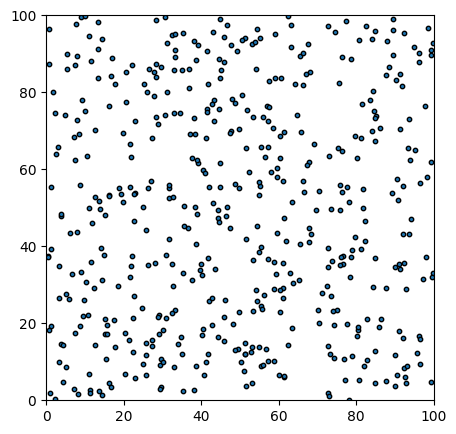

In [67]:
all_positions = model.datacollector.get_model_vars_dataframe() # Arreglo de matrices


fig, ax = plt.subplots(figsize= (5, 5))
scatter = ax.scatter(all_positions.iloc[0][0][:, 0], all_positions.iloc[0][0][:,1],
                      s = 10, edgecolor = 'k')
ax.axis([0, WIDTH, 0, HEIGHT])

def animate(i):
    scatter.set_offsets(all_positions.iloc[i][0])
    
anim = animation.FuncAnimation(fig, animate, frames = MAX_ITERATIONS)

In [68]:
anim